# importing python packages

In [1]:
import pandas as pd
import csv

In [2]:
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression

In [3]:
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
from datetime import datetime
import numpy as np



In [4]:
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer

In [5]:
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
import statsmodels.api as sm
import tqdm as tqdm
from tabulate import tabulate

# practice dataset (not as large as the ones below)

In [6]:
big_df_path = '/Users/annikaseo-yeonkim/Downloads/cncity_data/Machine1.csv'

In [7]:
def remove_char(this_char,row):
    that_row = row[0].split()
    new_row = []
    for char in that_row:
        if char != this_char:
            new_row.append(char)

    return new_row

In [8]:
def process_row(row):
    row = remove_char("|",row)
    return row
    

In [9]:
def count_rows_and_columns(file_path): # still debugging, same code as the one below but with tqdm and progress bar 
    row_count = 0
    column_count = 0
    
    # First, get the total number of lines to initialize tqdm
    with open(file_path, mode='r', encoding='utf-8') as file:
        total_lines = sum(1 for line in file)
    
    # Now read the file again with tqdm progress bar
    with open(file_path, mode='r', encoding='utf-8') as file:
        for line in tqdm.tqdm(file, total=total_lines, desc="Processing rows"):
            row_count += 1
            if row_count == 1:
                column_count = len(line.split(','))

    return row_count, column_count

# count_rows_and_columns(big_df_path)

In [10]:
def count_rows_and_columns(file_path):
    row_count = 0
    col_count = 0
    with open(file_path, mode='r', encoding='utf-8') as file:
        for line in file:
            row_count += 1
            if row_count == 1:
                # Assume the file is comma-separated
                column_count = len(line.split(','))

    return row_count, column_count
    
count_rows_and_columns(big_df_path)

(63690454, 1)

In [12]:
big_df_path = '/Users/annikaseo-yeonkim/Downloads/cncity_data/Machine1.csv'
rowList = []
try:
    with open(big_df_path, mode='r', encoding='utf-8') as file:
        csv_reader = csv.reader(file)
        for row_number, row in enumerate(csv_reader, start=1):
            if row_number > 86400:
                break
            try:
                my_row = process_row(row)
                print(my_row)
                rowList.append(my_row)
                # print(row[0].split())
            except Exception as e:
                print(f"Error processing row {row_number}: {e}")
except Exception as e:
    print(f"Error opening/reading file: {e}")

print("File processing completed.")




Error processing row 1: list index out of range
['machine_code', 'day', 'time', 'door_open', 'electricity_1', 'electricity_2', 'gas_leak', 'is_maintenance', 'machine_type', 'network_status', 'outside_temperature', 'panel_open', 'power_on', 'pressure_1', 'pressure_2', 'ssv1', 'ssv2', 'status_electricity_1', 'status_electricity_2', 'status_pressure_1', 'status_pressure_2', 'weektime']
['--------------+----------+--------+-----------+---------------+---------------+----------+----------------+--------------+----------------+---------------------+------------+----------+------------+------------+------+------+----------------------+----------------------+-------------------+-------------------+----------']
['1', '20220422', '235959', '0', '-1411', '0', '0', '0', 'null', '0', '14.5', '0', '0', '0.793', '2.025', '0', '0', '0', '0', '0', '0', '0']
['1', '20220422', '235958', '0', '-1411', '0', '0', '0', 'null', '0', '14.5', '0', '0', '0.793', '2.025', '0', '0', '0', '0', '0', '0', '0']
['1', 

In [13]:
headers = rowList[0]
headers_dict = {}
for i in range(len(headers)):
    headers_dict[i] = headers[i]

data = []
for i in range(1,len(rowList)):
    data.append(rowList[i])
data = data[2:]
table = tabulate(data,headers=headers,tablefmt = "grid")
table_df = pd.DataFrame(data)
table_df.rename(columns = headers_dict, inplace = True)
print(headers_dict)
# print(table_df.head())
# print(table_df['panel_open'])

{0: 'machine_code', 1: 'day', 2: 'time', 3: 'door_open', 4: 'electricity_1', 5: 'electricity_2', 6: 'gas_leak', 7: 'is_maintenance', 8: 'machine_type', 9: 'network_status', 10: 'outside_temperature', 11: 'panel_open', 12: 'power_on', 13: 'pressure_1', 14: 'pressure_2', 15: 'ssv1', 16: 'ssv2', 17: 'status_electricity_1', 18: 'status_electricity_2', 19: 'status_pressure_1', 20: 'status_pressure_2', 21: 'weektime'}


In [14]:
table_df['outside_temperature'].dropna().value_counts()

table_df['outside_temperature'] = table_df['outside_temperature'].replace('outside_temparature',14.5)

table_df['outside_temperature'].value_counts()

outside_temperature
22.9                   7200
11.5                   7200
12.1                   7200
15.1                   3600
16                     3600
17.4                   3600
19                     3600
21.3                   3600
21.8                   3600
10.8                   3600
22.6                   3600
11.4                   3600
20.9                   3600
20.1                   3600
17                     3600
14.4                   3600
11.8                   3600
14.6                   3600
22.5                   3600
14.5                   3599
12.7                   1083
outside_temperature     838
Name: count, dtype: int64

In [16]:
table_df['time'].dropna().sort_values()
temp_col = table_df['time'].dropna().sort_values()
new_col = []
for row in temp_col:
    if row != 'time':
        new_col.append(row)


In [93]:
plt.plot(table_df['time'].dropna().sort_values(),table_df['electricity_1'].dropna().sort_values(ascending = False)) 
# plt.plot(new_col, table_df['electricity_1'].dropna())

NameError: name 'table_df' is not defined

# decision trees

In [1]:
from sklearn.tree import DecisionTreeClassifier

In [ ]:
table_df['network_status'].value_counts()

network_status
0                 4852
network_status      48
Name: count, dtype: int64

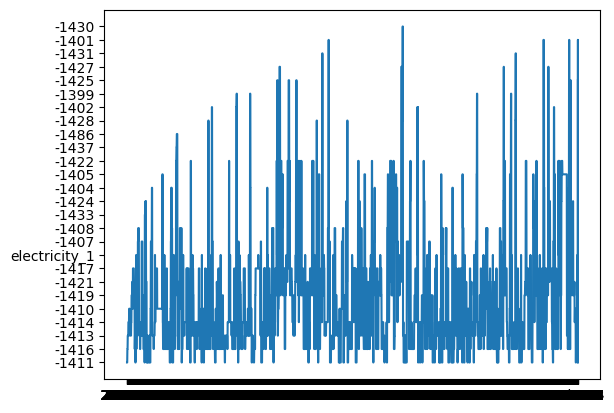

In [ ]:
plt.plot(table_df['time'].dropna().sort_values(),table_df['electricity_1'].dropna())

In [ ]:
model_new = LinearRegression()

In [ ]:
pressure_2_list = list(table_df['pressure_2'].dropna())
new_2_list = []
for item in pressure_2_list:
    if item != 'pressure_2':
        new_2_list.append(item)

print(new_2_list)

pressure_2_array = np.array(new_2_list)

['2.025', '2.025', '2.025', '2.025', '2.025', '2.025', '2.025', '2.024', '2.024', '2.024', '2.024', '2.024', '2.024', '2.024', '2.022', '2.022', '2.022', '2.022', '2.024', '2.024', '2.024', '2.024', '2.029', '2.029', '2.029', '2.029', '2.029', '2.029', '2.029', '2.029', '2.029', '2.029', '2.029', '2.027', '2.027', '2.027', '2.027', '2.029', '2.029', '2.029', '2.029', '2.029', '2.029', '2.029', '2.033', '2.033', '2.033', '2.033', '2.031', '2.031', '2.031', '2.031', '2.031', '2.031', '2.031', '2.027', '2.027', '2.027', '2.027', '2.034', '2.034', '2.034', '2.034', '2.042', '2.042', '2.042', '2.042', '2.042', '2.042', '2.042', '2.042', '2.042', '2.042', '2.042', '2.047', '2.047', '2.047', '2.047', '2.047', '2.047', '2.047', '2.047', '2.04', '2.04', '2.04', '2.027', '2.027', '2.027', '2.027', '2.02', '2.02', '2.02', '2.02', '2.027', '2.027', '2.027', '2.027', '2.027', '2.027', '2.027', '2.038', '2.038', '2.038', '2.038', '2.049', '2.049', '2.049', '2.049', '2.049', '2.049', '2.049', '2.049'

In [1]:
# pressure_2_array = pressure_2_array.reshape(-1,1)
# for item in pressure_2_array:
#     item  = float(item)

new_pressure_2_array = []
for item in pressure_2_array:
    new_pressure_2_array.append(float(item))

print(new_pressure_2_array)

NameError: name 'pressure_2_array' is not defined

In [ ]:
new_pressure_2_array = np.array(new_pressure_2_array)

In [2]:
import tqdm as tqdm

In [3]:
newListTime= []
for item in tqdm(table_df['time'].dropna()):
    if item != 'time':
        newListTime.append(item)

print(len(newListTime))

NameError: name 'table_df' is not defined

In [52]:
newListTime2 = []
for item in newListTime:
    newListTime2.append(int(item))

print(newListTime2)


[235958, 235957, 235956, 235955, 235954, 235953, 235952, 235951, 235950, 235949, 235948, 235947, 235946, 235945, 235944, 235943, 235942, 235941, 235940, 235939, 235938, 235937, 235936, 235935, 235934, 235933, 235932, 235931, 235930, 235929, 235928, 235927, 235926, 235925, 235924, 235923, 235922, 235921, 235920, 235919, 235918, 235917, 235916, 235915, 235914, 235913, 235912, 235911, 235910, 235909, 235908, 235907, 235906, 235905, 235904, 235903, 235902, 235901, 235900, 235859, 235858, 235857, 235856, 235855, 235854, 235853, 235852, 235851, 235850, 235849, 235848, 235847, 235846, 235845, 235844, 235843, 235842, 235841, 235840, 235839, 235838, 235837, 235836, 235835, 235834, 235833, 235832, 235831, 235830, 235829, 235828, 235827, 235826, 235825, 235824, 235823, 235822, 235821, 235820, 235819, 235818, 235817, 235816, 235815, 235814, 235813, 235812, 235811, 235810, 235809, 235808, 235807, 235806, 235805, 235804, 235803, 235802, 235801, 235800, 235759, 235758, 235757, 235756, 235755, 235754,

In [66]:
new_electricity_list = []
for item in table_df['electricity_1'].dropna():
    if item != 'electricity_1':
        new_electricity_list.append(int(item))

new_electricity_array = np.array(new_electricity_list)

model_new.fit(np.array(newListTime2).reshape(-1,1), new_electricity_array.reshape(-1,1))

LinearRegression()

In [67]:
y_new_pred = model_new.predict(new_electricity_array.reshape(-1,1))

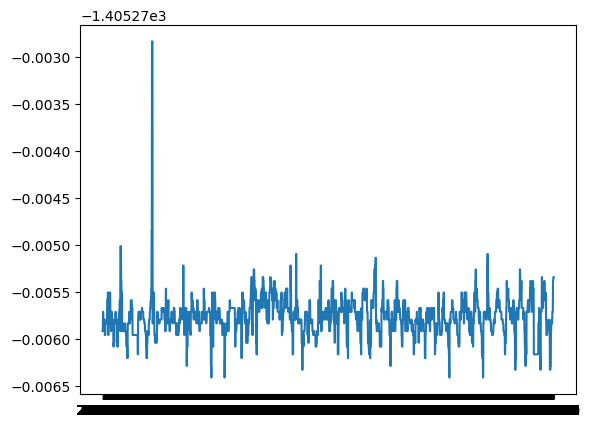

In [68]:
plt.plot(newListTime,y_new_pred)

In [76]:
model_pressure_2 = LinearRegression()

In [77]:
model_pressure_2.fit(np.array(newListTime2).reshape(-1,1),new_pressure_2_array.reshape(-1,1))

LinearRegression()

In [79]:
y_pred_pressure = model_pressure_2.predict(new_pressure_2_array.reshape(-1,1))

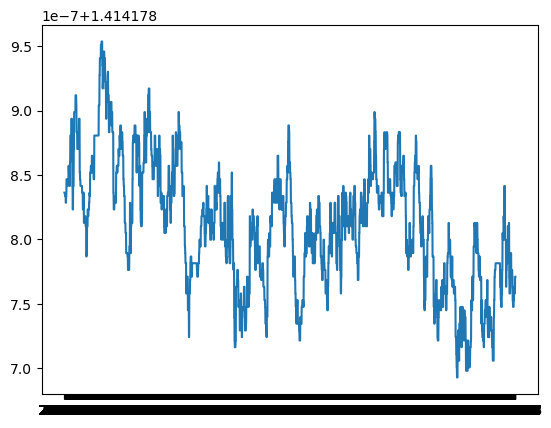

In [80]:
plt.plot(newListTime,y_pred_pressure)

In [82]:
model_pressure_2.coef_

array([[2.60484877e-06]])

In [95]:
new_table_df = table_df.dropna()

In [90]:
print(table_df['gas_leak'].value_counts())

gas_leak
0           4852
gas_leak      48
Name: count, dtype: int64


In [96]:
new_table_df.head()

,machine_code,day,time,door_open,electricity_1,electricity_2,gas_leak,is_maintenance,machine_type,network_status,...,power_on,pressure_1,pressure_2,ssv1,ssv2,status_electricity_1,status_electricity_2,status_pressure_1,status_pressure_2,weektime
0,1,20220422,235958,0,-1411,0,0,0,null,0,...,0,0.793,2.025,0,0,0,0,0,0,0
1,1,20220422,235957,0,-1411,0,0,0,null,0,...,0,0.793,2.025,0,0,0,0,0,0,0
2,1,20220422,235956,0,-1411,0,0,0,null,0,...,0,0.793,2.025,0,0,0,0,0,0,0
3,1,20220422,235955,0,-1416,0,0,0,null,0,...,0,0.793,2.025,0,0,0,0,0,0,0
4,1,20220422,235954,0,-1416,0,0,0,null,0,...,0,0.793,2.025,0,0,0,0,0,0,0


In [97]:
new_table_df['time']

0       235958
1       235957
2       235956
3       235955
4       235954
         ...  
4943    223911
4944    223910
4945    223909
4946    223908
4947    223907
Name: time, Length: 4900, dtype: object

In [103]:
new_pressure_list = []
for item in new_table_df['pressure_1'].dropna():
    if item != 'pressure_1':
        new_pressure_list.append(float(item))

new_pressure_list_2 = []
for item in new_table_df['pressure_2'].dropna():
    if item != 'pressure_2':
        new_pressure_list_2.append(float(item))

In [105]:
import matplotlib.pyplot as plt 
import numpy as np 
import math 

In [112]:
print(len(new_electricity_list))
print(new_pressure_2_array)
print(new_table_df['electricity_2'])

4852
[2.025 2.025 2.025 ... 2.    2.    2.   ]
0       0
1       0
2       0
3       0
4       0
       ..
4943    0
4944    0
4945    0
4946    0
4947    0
Name: electricity_2, Length: 4900, dtype: object


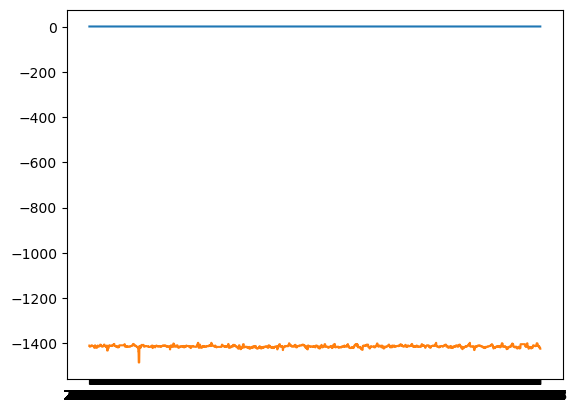

In [109]:
plt.plot(newListTime, new_pressure_list_2)
plt.plot(newListTime, new_electricity_list)
plt.show()

In [117]:
new_electricity_list

[-1411,
 -1411,
 -1411,
 -1416,
 -1416,
 -1416,
 -1416,
 -1413,
 -1413,
 -1413,
 -1413,
 -1413,
 -1413,
 -1413,
 -1414,
 -1414,
 -1414,
 -1414,
 -1414,
 -1414,
 -1414,
 -1414,
 -1410,
 -1410,
 -1410,
 -1410,
 -1410,
 -1410,
 -1410,
 -1413,
 -1413,
 -1413,
 -1413,
 -1413,
 -1413,
 -1413,
 -1413,
 -1413,
 -1413,
 -1413,
 -1413,
 -1413,
 -1413,
 -1413,
 -1414,
 -1414,
 -1414,
 -1414,
 -1419,
 -1419,
 -1419,
 -1419,
 -1419,
 -1419,
 -1419,
 -1421,
 -1421,
 -1421,
 -1421,
 -1410,
 -1410,
 -1410,
 -1410,
 -1417,
 -1417,
 -1417,
 -1417,
 -1417,
 -1417,
 -1417,
 -1417,
 -1417,
 -1417,
 -1417,
 -1421,
 -1421,
 -1421,
 -1421,
 -1421,
 -1421,
 -1421,
 -1421,
 -1416,
 -1416,
 -1416,
 -1413,
 -1413,
 -1413,
 -1413,
 -1411,
 -1411,
 -1411,
 -1411,
 -1416,
 -1416,
 -1416,
 -1416,
 -1416,
 -1416,
 -1416,
 -1414,
 -1414,
 -1414,
 -1414,
 -1414,
 -1414,
 -1414,
 -1414,
 -1413,
 -1413,
 -1413,
 -1413,
 -1413,
 -1413,
 -1413,
 -1407,
 -1407,
 -1407,
 -1407,
 -1408,
 -1408,
 -1408,
 -1408,
 -1408,
 -1408,


In [126]:
len(new_electricity_list)

4852

In [133]:
new_table_df['time']

0       235958
1       235957
2       235956
3       235955
4       235954
         ...  
4943    223911
4944    223910
4945    223909
4946    223908
4947    223907
Name: time, Length: 4900, dtype: object

In [138]:
newListTime2

[235958,
 235957,
 235956,
 235955,
 235954,
 235953,
 235952,
 235951,
 235950,
 235949,
 235948,
 235947,
 235946,
 235945,
 235944,
 235943,
 235942,
 235941,
 235940,
 235939,
 235938,
 235937,
 235936,
 235935,
 235934,
 235933,
 235932,
 235931,
 235930,
 235929,
 235928,
 235927,
 235926,
 235925,
 235924,
 235923,
 235922,
 235921,
 235920,
 235919,
 235918,
 235917,
 235916,
 235915,
 235914,
 235913,
 235912,
 235911,
 235910,
 235909,
 235908,
 235907,
 235906,
 235905,
 235904,
 235903,
 235902,
 235901,
 235900,
 235859,
 235858,
 235857,
 235856,
 235855,
 235854,
 235853,
 235852,
 235851,
 235850,
 235849,
 235848,
 235847,
 235846,
 235845,
 235844,
 235843,
 235842,
 235841,
 235840,
 235839,
 235838,
 235837,
 235836,
 235835,
 235834,
 235833,
 235832,
 235831,
 235830,
 235829,
 235828,
 235827,
 235826,
 235825,
 235824,
 235823,
 235822,
 235821,
 235820,
 235819,
 235818,
 235817,
 235816,
 235815,
 235814,
 235813,
 235812,
 235811,
 235810,
 235809,
 235808,
 

In [140]:
new_electricity_array

array([-1411, -1411, -1411, ..., -1425, -1425, -1425])

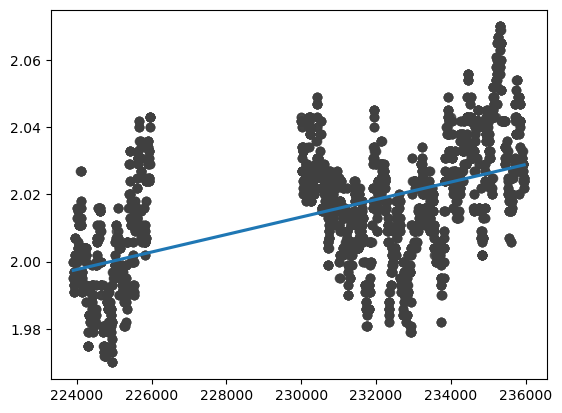

In [142]:
ax = sns.regplot(x=newListTime2, y= new_pressure_2_array, data=new_table_df, ci=None, scatter_kws=dict(color='0.25'))

# cassandraConnect

In [11]:
import os
import sys

# Data Analysis
import pandas as pd

# Cassandra
from connection_manager import cassandraConnect
from cassandra.query import dict_factory

In [92]:
PORT = 9042
KEYSPACE = "cncity_server"
TABLE = "all_data"

# Source DB
CONTACT_POINTS = ["39.118.41.24"]
USERNAME = "cnscada"
PW = "cnscada123!@#"

cc = cassandraConnect(CONTACT_POINTS, USERNAME, PW)
cc.session.row_factory = dict_factory

Connected to Cassandra Successfully: ['39.118.41.24'] 9042


In [13]:
use_machine_code = 1
use_day = 20240422
# save_path = os.path.join('.', 'data', f'Machine{use_machine_code}_{use_day}.csv')

###################################

query = """
    SELECT *
    FROM {keyspace_name}.{table_name}
    WHERE machine_code = {query_machine_code}
    AND day = {query_day}
""".format(
    keyspace_name = KEYSPACE,
    table_name = TABLE,
    query_machine_code = use_machine_code,
    query_day = use_day
)

query_result = cc.session.execute(query)
###################################

# Pandas DataFrame으로 전환
df = pd.DataFrame(list(query_result)).sort_values(by='time')
# df.to_csv(save_path, index=False)

print(df.shape)
df.head()

(86188, 22)


,machine_code,day,time,door_open,electricity_1,electricity_2,gas_leak,is_maintenance,machine_type,network_status,...,power_on,pressure_1,pressure_2,ssv1,ssv2,status_electricity_1,status_electricity_2,status_pressure_1,status_pressure_2,weektime
86187,1,20240422,0,0,-1399.0,0.0,0,0,1,0,...,0,0.797,2.122,0,0,0,0,0,0,0
86186,1,20240422,1,0,-1399.0,0.0,0,0,1,0,...,0,0.797,2.122,0,0,0,0,0,0,0
86185,1,20240422,2,0,-1399.0,0.0,0,0,1,0,...,0,0.797,2.122,0,0,0,0,0,0,0
86184,1,20240422,3,0,-1399.0,0.0,0,0,1,0,...,0,0.797,2.122,0,0,0,0,0,0,0
86183,1,20240422,4,0,-1399.0,0.0,0,0,1,0,...,0,0.797,2.122,0,0,0,0,0,0,0


In [91]:
df['time']

86187         0
86186         1
86185         2
86184         3
86183         4
          ...  
4        235955
3        235956
2        235957
1        235958
0        235959
Name: time, Length: 86188, dtype: int64

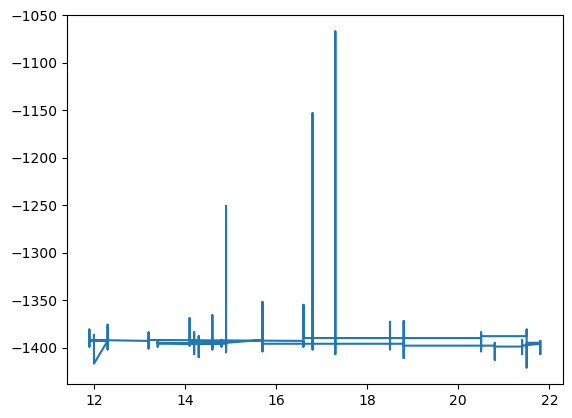

In [15]:
plt.plot(df['outside_temperature'],df['electricity_1'])

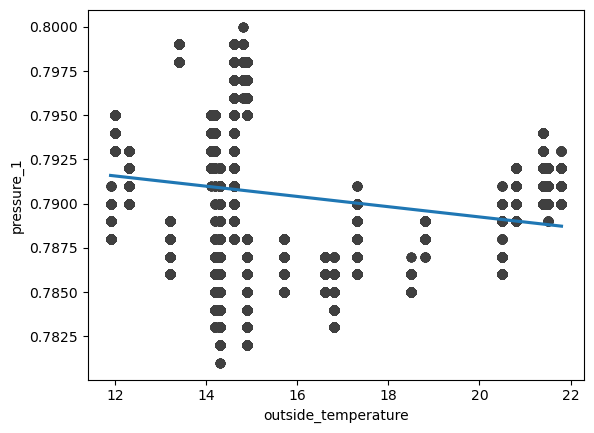

In [16]:
ax = sns.regplot(x='outside_temperature', y= 'pressure_1', data=df, ci=None, scatter_kws=dict(color='0.25'))

In [17]:
df.columns

Index(['machine_code', 'day', 'time', 'door_open', 'electricity_1',
       'electricity_2', 'gas_leak', 'is_maintenance', 'machine_type',
       'network_status', 'outside_temperature', 'panel_open', 'power_on',
       'pressure_1', 'pressure_2', 'ssv1', 'ssv2', 'status_electricity_1',
       'status_electricity_2', 'status_pressure_1', 'status_pressure_2',
       'weektime'],
      dtype='object')

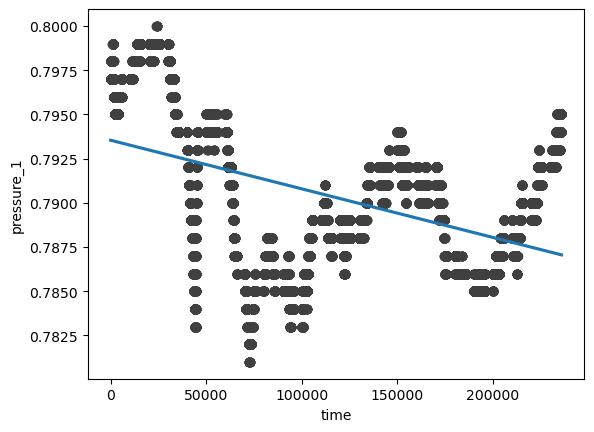

In [18]:
ax = sns.regplot(x='time',y='pressure_1',data=df,ci = None, scatter_kws = dict(color = '0.25'))

In [19]:
model_lin_reg = LinearRegression()

In [20]:
time_array = np.array(df['time']).reshape(-1,1)
pressure_array = np.array(df['pressure_1']).reshape(-1,1)

In [21]:
model_lin_reg.fit(time_array, pressure_array)

LinearRegression()

In [22]:
y_prediction = model_lin_reg.predict(pressure_array)

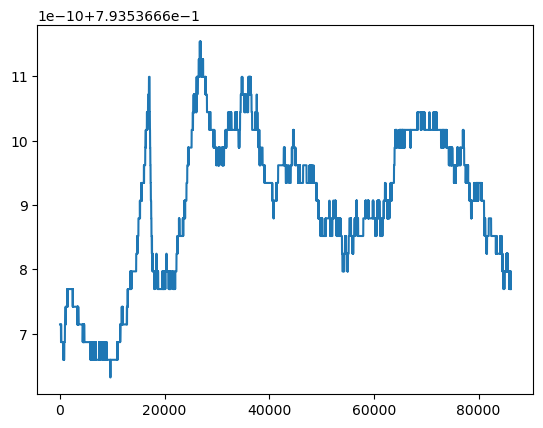

In [23]:
plt.plot(y_prediction)

In [24]:
df['is_maintenance'].value_counts()

is_maintenance
0    86068
2      120
Name: count, dtype: int64

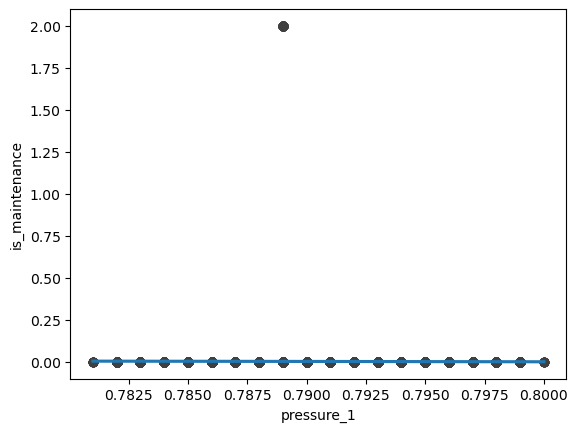

In [25]:
ax = sns.regplot(x = 'pressure_1', y='is_maintenance',data= df,ci = None, scatter_kws = dict(color = '0.25'))

In [26]:
model_2 = LinearRegression()

In [27]:
maintenance_array = np.array(df['is_maintenance']).reshape(-1,1)

In [28]:
X_train, X_test, y_train, y_test = train_test_split(pressure_array,maintenance_array , 
                                   random_state=104,  
                                   test_size=0.25,  
                                   shuffle=True) 

In [29]:
model_2.fit(X_train, y_train)

LinearRegression()

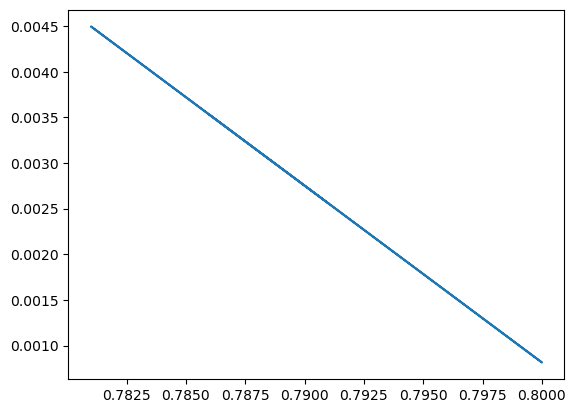

In [30]:
plt.plot(X_test, model_2.predict(X_test))

In [31]:
model_log = LogisticRegression()

In [32]:
model_log.fit(X_train, y_train)

/Users/annikaseo-yeonkim/anaconda3/lib/python3.11/site-packages/sklearn/utils/validation.py:1184: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


LogisticRegression()

In [33]:
y_pred_log = model_log.predict(X_test)

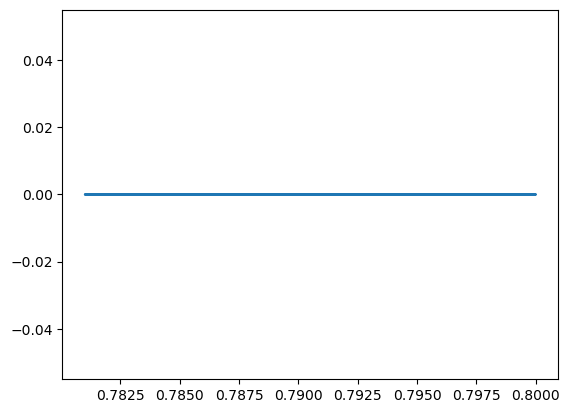

In [34]:
plt.plot(X_test, y_pred_log)

In [35]:
pressure_2_array = np.array(df['pressure_2']).reshape(-1,1)

In [36]:
new_X_train, new_X_test, new_y_train, new_y_test = train_test_split(pressure_2_array,maintenance_array , 
                                   random_state=104,  
                                   test_size=0.25,  
                                   shuffle=True) 

In [37]:
model_log.fit(new_X_train, new_y_train)

/Users/annikaseo-yeonkim/anaconda3/lib/python3.11/site-packages/sklearn/utils/validation.py:1184: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


LogisticRegression()

In [38]:
y_pred_new = model_log.predict(new_X_test)

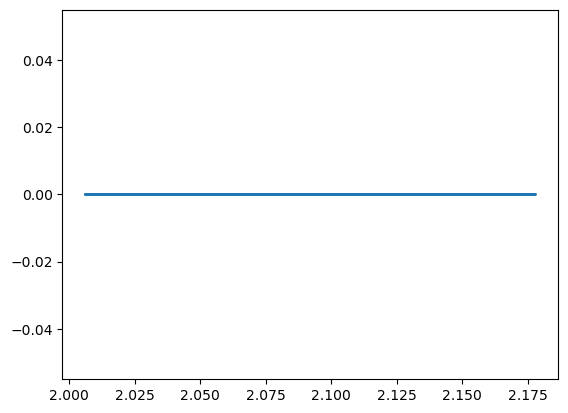

In [39]:
plt.plot(new_X_test, y_pred_new)

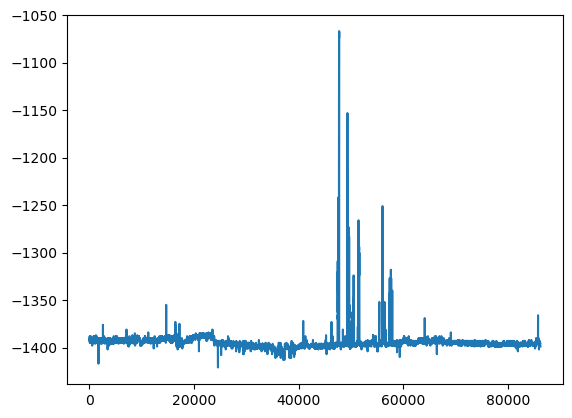

In [40]:
plt.plot(df['electricity_1'])

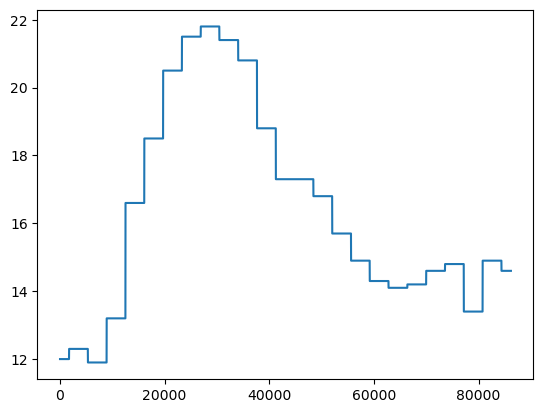

In [41]:
plt.plot(df['outside_temperature'])

In [42]:
model_gas_and_temp = LinearRegression()

In [43]:
pressure_1_array = np.array(df['pressure_1']).reshape(-1,1)
temperature_array= np.array(df['outside_temperature']).reshape(-1,1)

In [44]:
temp_train, temp_test, pressure_train, pressure_test = train_test_split(temperature_array, pressure_1_array, random_state=104, test_size=0.25, shuffle=True )

In [45]:
model_gas_and_temp.fit(temp_train, pressure_train)

LinearRegression()

In [46]:
predicted_pressure = model_gas_and_temp.predict(temp_test)

In [47]:
a = float(model_gas_and_temp.coef_)
b = float(model_gas_and_temp.intercept_)
print(f'y = {a:.7f}x + {b:3f}')

y = -0.0002944x + 0.795132


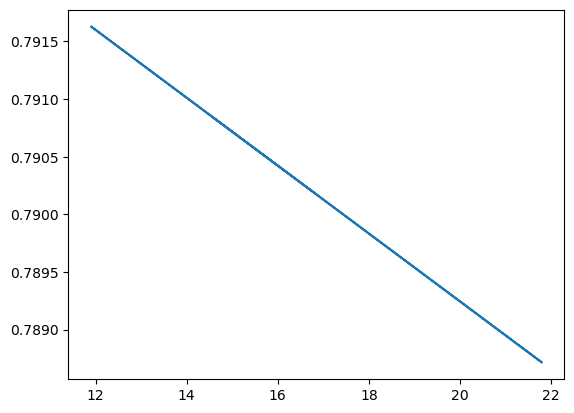

In [48]:
plt.plot(temp_test,predicted_pressure)
plt.xlabel = 'temperature'
plt.ylabel = 'pressure_1'

In [49]:
model_electricity_pressure = LinearRegression()

In [50]:
electricity_1_array = np.array(df['electricity_1']).reshape(-1,1)
pressure_2_array = np.array(df['pressure_2']).reshape(-1,1)

In [51]:
electricity_train, electricity_test, pressure_train, pressure_test = train_test_split(electricity_1_array, pressure_2_array,random_state=104, test_size=0.25, shuffle=True)

In [52]:
model_electricity_pressure.fit(electricity_train, pressure_train)

LinearRegression()

In [53]:
y_pred_pressure = model_electricity_pressure.predict(electricity_test)


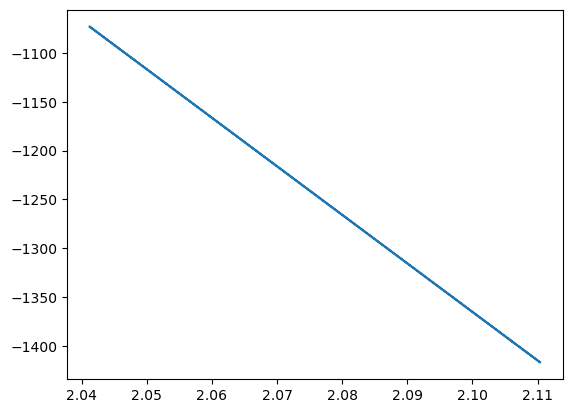

In [54]:
plt.plot(y_pred_pressure, electricity_test)

# Autocorrelation using lag plot - testing for stationarity

<Axes: xlabel='y(t)', ylabel='y(t + 1)'>

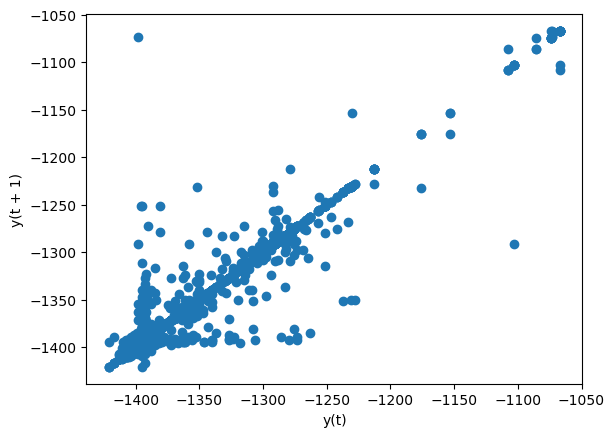

In [55]:
pd.plotting.lag_plot(df['electricity_1'],lag=1)

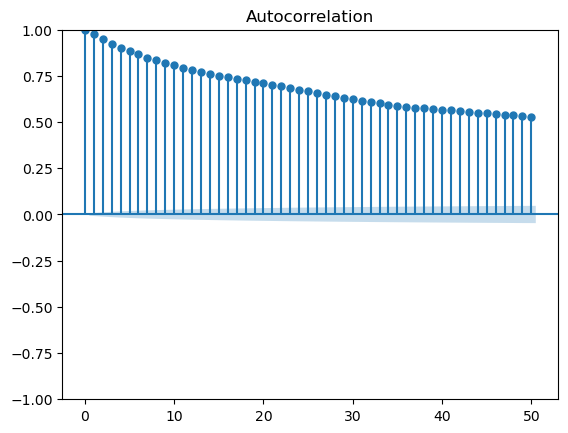

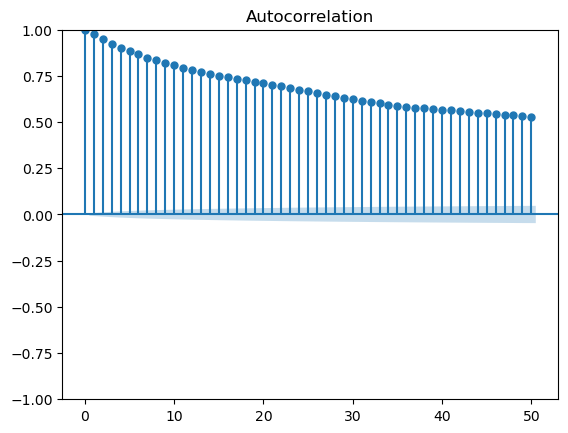

In [56]:
plot_acf(df['electricity_1'])

# Moving average (transforming the dataset into a stationary time series)

In [57]:
window_size = 1000

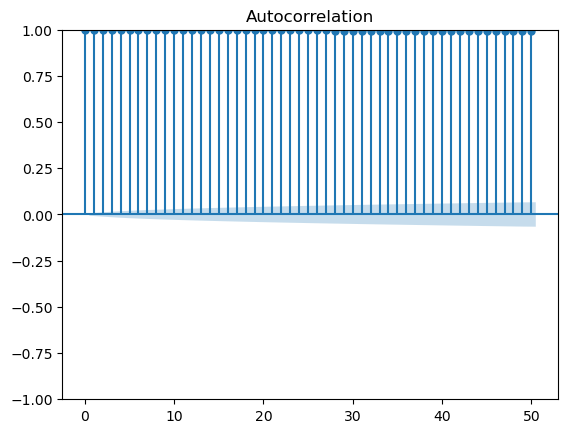

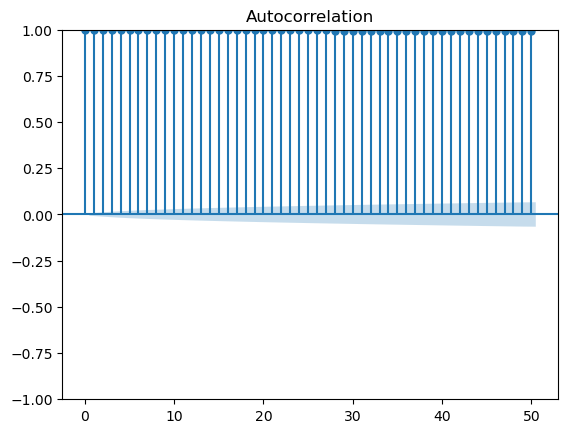

In [58]:
# log transformation - does nothing
log_pressure = np.log(df['pressure_1'])
plot_acf(log_pressure)

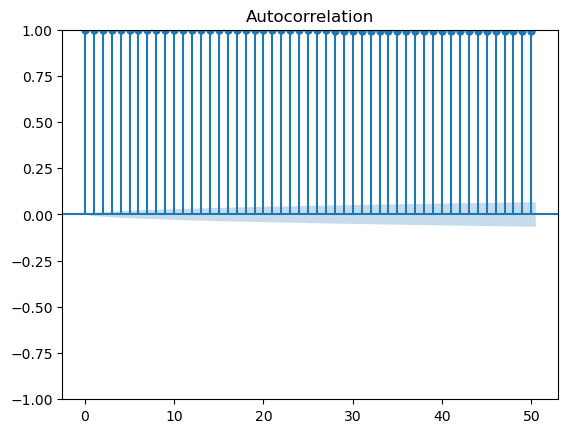

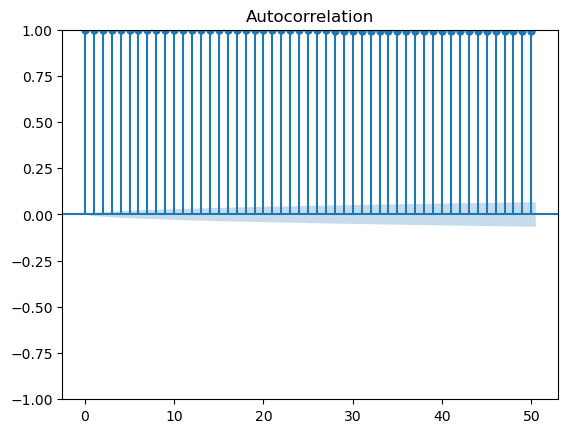

In [59]:
plot_acf(df['pressure_1'])

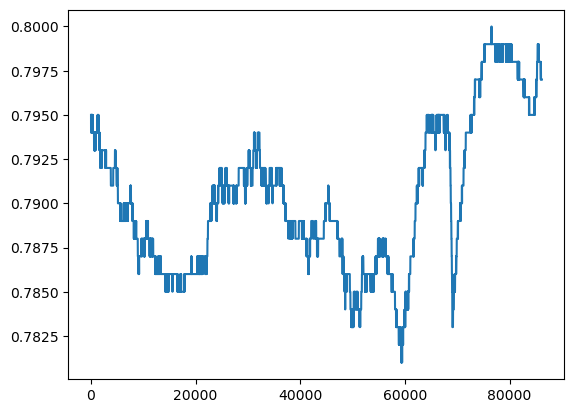

In [60]:
plt.plot(df['pressure_1'])

# Augmented Dickey-Fuller Test (optional, will resume later if time permits)

# Plotting Rolling Statistics

In [61]:
rolling_average = df.electricity_1.rolling(10000).mean()

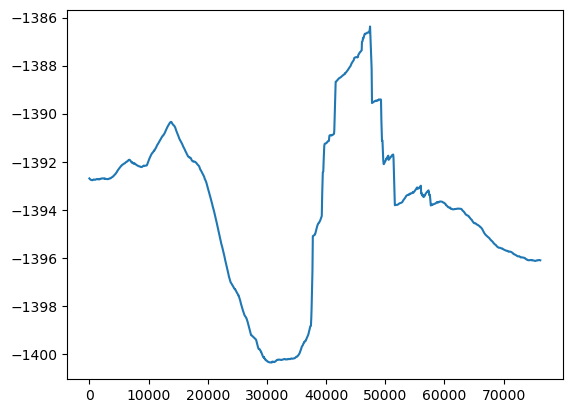

In [62]:
plt.plot(rolling_average)

In [63]:
rolling_average_pressure = df.pressure_1.rolling(1000).mean()

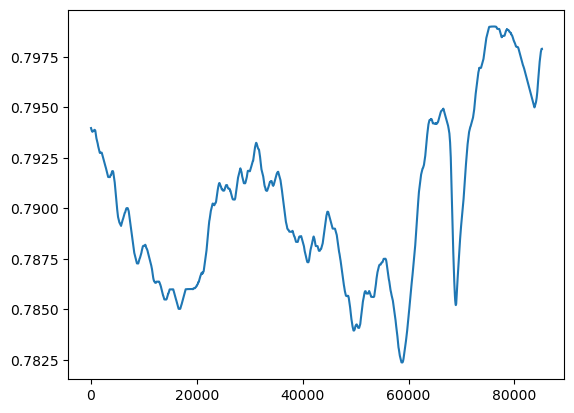

In [64]:
plt.plot(rolling_average_pressure)

In [65]:
rolling_average_pressure_1 = df.pressure_1.rolling(10000).mean()

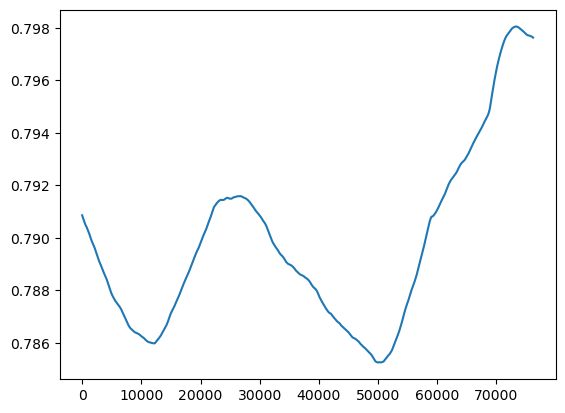

In [66]:
plt.plot(rolling_average_pressure_1)

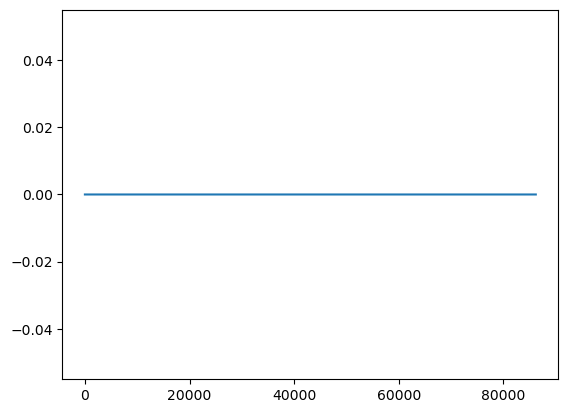

In [67]:
plt.plot(df['electricity_2'])

In [68]:
rolling_average_electricity_2 = df.electricity_2.rolling(1000).mean()

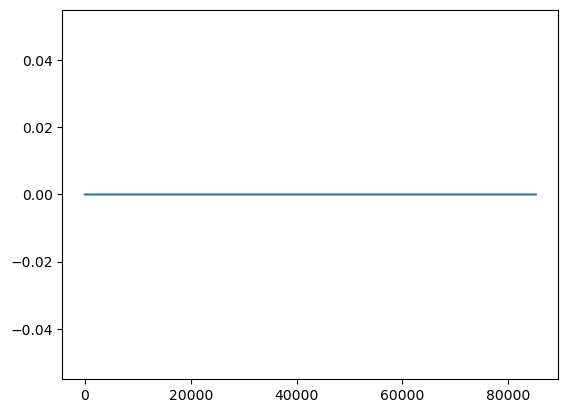

In [69]:
plt.plot(rolling_average_electricity_2)

In [70]:
df.columns

Index(['machine_code', 'day', 'time', 'door_open', 'electricity_1',
       'electricity_2', 'gas_leak', 'is_maintenance', 'machine_type',
       'network_status', 'outside_temperature', 'panel_open', 'power_on',
       'pressure_1', 'pressure_2', 'ssv1', 'ssv2', 'status_electricity_1',
       'status_electricity_2', 'status_pressure_1', 'status_pressure_2',
       'weektime'],
      dtype='object')

In [71]:
df['is_maintenance'].value_counts()

is_maintenance
0    86068
2      120
Name: count, dtype: int64

In [72]:
new_df = df.copy()

In [73]:
new_df.columns

Index(['machine_code', 'day', 'time', 'door_open', 'electricity_1',
       'electricity_2', 'gas_leak', 'is_maintenance', 'machine_type',
       'network_status', 'outside_temperature', 'panel_open', 'power_on',
       'pressure_1', 'pressure_2', 'ssv1', 'ssv2', 'status_electricity_1',
       'status_electricity_2', 'status_pressure_1', 'status_pressure_2',
       'weektime'],
      dtype='object')

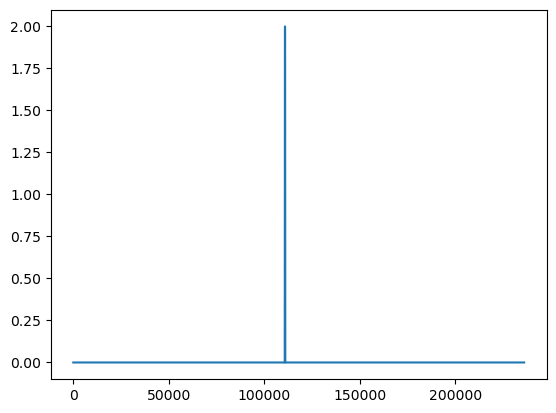

In [74]:
plt.plot(df['time'],df['is_maintenance'])

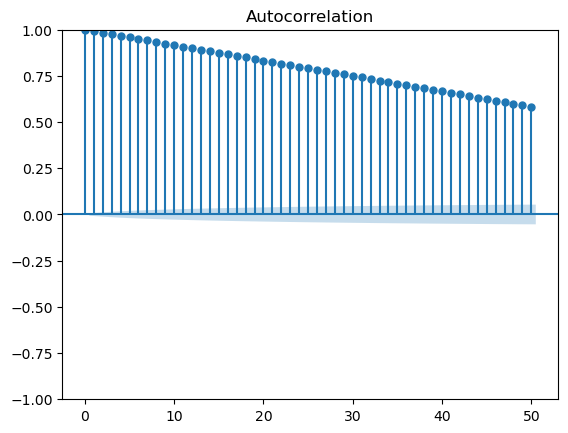

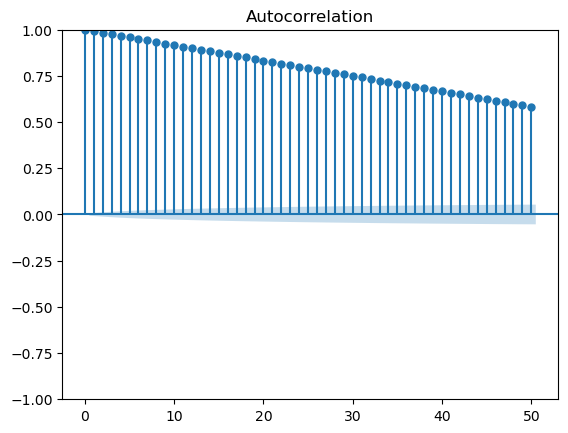

In [75]:
plot_acf(df['is_maintenance'])

# Decomposition

In [76]:

from statsmodels.tsa.seasonal import seasonal_decompose
series = df['is_maintenance']
result = seasonal_decompose(series, model='additive')

ValueError: You must specify a period or x must be a pandas object with a PeriodIndex or a DatetimeIndex with a freq not set to None

# brought to you by ChatGpt and should only be used for research purposes; irrelevant for the task


In [198]:
date_rng = pd.date_range(start='2023-01-01', end='2023-01-10', freq='D')
sample_df = pd.DataFrame(date_rng, columns=['date'])
sample_df['data'] = pd.Series(range(10))

# Set the index to be the datetime column
sample_df.set_index('date', inplace=True)

# Check the type of index
print(type(sample_df.index))  # Should output <class 'pandas.core.indexes.datetimes.DatetimeIndex'>

# Ensure the index has a frequency set
sample_df.index.freq = pd.infer_freq(sample_df.index)

# Now you can use operations that require a DatetimeIndex with a frequency
resampled_df = sample_df.resample('2D').sum()

print(resampled_df)

<class 'pandas.core.indexes.datetimes.DatetimeIndex'>
            data
date            
2023-01-01     1
2023-01-03     5
2023-01-05     9
2023-01-07    13
2023-01-09    17


In [199]:
df.columns

Index(['machine_code', 'day', 'time', 'door_open', 'electricity_1',
       'electricity_2', 'gas_leak', 'is_maintenance', 'machine_type',
       'network_status', 'outside_temperature', 'panel_open', 'power_on',
       'pressure_1', 'pressure_2', 'ssv1', 'ssv2', 'status_electricity_1',
       'status_electricity_2', 'status_pressure_1', 'status_pressure_2',
       'weektime'],
      dtype='object')

In [200]:
df.head()

,machine_code,day,time,door_open,electricity_1,electricity_2,gas_leak,is_maintenance,machine_type,network_status,...,power_on,pressure_1,pressure_2,ssv1,ssv2,status_electricity_1,status_electricity_2,status_pressure_1,status_pressure_2,weektime
86187,1,20240422,0,0,-1399.0,0.0,0,0,1,0,...,0,0.797,2.122,0,0,0,0,0,0,0
86186,1,20240422,1,0,-1399.0,0.0,0,0,1,0,...,0,0.797,2.122,0,0,0,0,0,0,0
86185,1,20240422,2,0,-1399.0,0.0,0,0,1,0,...,0,0.797,2.122,0,0,0,0,0,0,0
86184,1,20240422,3,0,-1399.0,0.0,0,0,1,0,...,0,0.797,2.122,0,0,0,0,0,0,0
86183,1,20240422,4,0,-1399.0,0.0,0,0,1,0,...,0,0.797,2.122,0,0,0,0,0,0,0


In [77]:
print(type(df['is_maintenance'].index))

<class 'pandas.core.indexes.base.Index'>


In [78]:
maintenance_df = df['is_maintenance']
maintenance_df = maintenance_df.set_axis(labels = df['time'])

In [79]:
df['time'].sort_values()

86187         0
86186         1
86185         2
86184         3
86183         4
          ...  
4        235955
3        235956
2        235957
1        235958
0        235959
Name: time, Length: 86188, dtype: int64

In [80]:
print(type(maintenance_df.index))

<class 'pandas.core.indexes.base.Index'>


In [81]:
new_time_index =pd.to_datetime(df['time'].sort_values(),errors = 'coerce')
maintenance_df = maintenance_df.set_axis(labels = new_time_index)

In [83]:
print(type(maintenance_df.index))

<class 'pandas.core.indexes.datetimes.DatetimeIndex'>


In [84]:
maintenance_df

time
1970-01-01 00:00:00.000000000    0
1970-01-01 00:00:00.000000001    0
1970-01-01 00:00:00.000000002    0
1970-01-01 00:00:00.000000003    0
1970-01-01 00:00:00.000000004    0
                                ..
1970-01-01 00:00:00.000235955    0
1970-01-01 00:00:00.000235956    0
1970-01-01 00:00:00.000235957    0
1970-01-01 00:00:00.000235958    0
1970-01-01 00:00:00.000235959    0
Name: is_maintenance, Length: 86188, dtype: int64

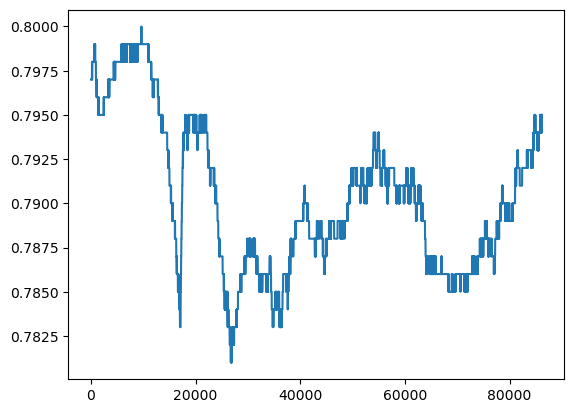

In [85]:
plt.plot(pressure_1_array)

In [230]:
series = maintenance_df
result = seasonal_decompose(series, model='additive')

ValueError: You must specify a period or x must be a pandas object with a PeriodIndex or a DatetimeIndex with a freq not set to None

<Axes: xlabel='y(t)', ylabel='y(t + 1)'>

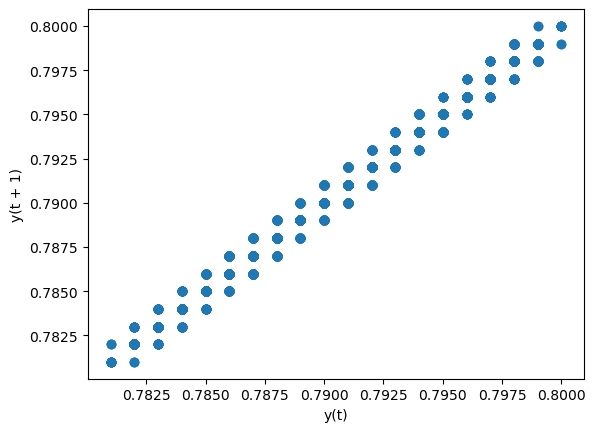

In [86]:
pd.plotting.lag_plot(df['pressure_1'],lag=1) # linear lag plot, will use an autoregressive model to further examine the data

In [90]:
   
df['pressure_1'].corr(df['pressure_1'].shift(1000))

0.9184823349674819